# Set up Environment

In [61]:
import logging, sys
import numpy as np
sys.path.insert(0, "../..")
import scirpy as ir
import scanpy as sc
from glob import glob
import pandas as pd
import tarfile
import anndata
import warnings
from matplotlib import pyplot as plt
from numba import NumbaPerformanceWarning


# Since we have debugged the code and know that everything works fine, we now supress all kinds of unwanted messages generated
# and only keep the printed or necessary results. This is for the purpose of better readability of the .pdf report generated.

import warnings
warnings.simplefilter('ignore')

logging.disable(sys.maxsize)
# ignore numba performance warnings
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

# suppress "storing XXX as categorical" warnings.
anndata.logging.anndata_logger.setLevel("ERROR")

# Load Data

In [62]:
# Data is loaded raw without any filtering
dataset_names =['289_Pri','290_Pri','295','296_Pri_CD8pos','305_1_Pri','307_Pri','309_Pri','310','314','316',
                '290_LN2','291_Pri','296_Pri_CD8neg','304_Pri','305_2_Pri','307_sLN','309_sLN','313','315',
                '325_Pri', '325_sLN', '330_Pri', '330_Met','338_Pri','338_LN2']

data_sets = {}
for name in dataset_names:
    rna_file_path = '/data/scRNA/'+'HN'+name+'/filtered_feature_bc_matrix'
    tcr_file_path = '/data/scTCR/'+'VDJ'+name+'/filtered_contig_annotations.csv'
    
    data = sc.read_10x_mtx(rna_file_path,var_names='gene_symbols')
    # merge in the TCR data
    TCR_data = ir.io.read_10x_vdj(tcr_file_path)
    ir.pp.merge_with_tcr(data, TCR_data)
    
    data_sets[name] = data
    data_sets[name].var_names_make_unique(join='_')
for name in dataset_names: 
    data_sets[name].obs['sample'] = name
    
# group label
for name in dataset_names:
    if name.find('sLN')!=-1:
        data_sets[name].obs['group'] = 'Sentinnel LN'
    elif name.find('LN2')!=-1 or name.find('Met')!=-1:
        data_sets[name].obs['group'] = 'Metastatic'
    else:
        data_sets[name].obs['group'] = 'Primary'
        
# batch label
batches = {'batch1':['289_Pri','290_Pri','290_LN2','291_Pri'],
           'batch2':['296_Pri_CD8pos','305_1_Pri','296_Pri_CD8neg','304_Pri','305_2_Pri'],
           'batch3':['295','307_Pri','309_Pri','310','314','316','307_sLN','309_sLN','313','315'],
           'batch4':['325_Pri','325_sLN','330_Pri','330_Met'],
           'batch5':['338_Pri','338_LN2']}
for batch in batches:
    for name in batches[batch]:
        data_sets[name].obs['bat'] = batch

#### Check that all files are loaded, there should be 19 samples in total

In [108]:
len(data_sets)

25

#### Merging all datasets

In [64]:
combined = data_sets['289_Pri'].concatenate(data_sets[name] for name in data_sets if name!='289_Pri')

# QC Metrics

In [65]:
sc.pp.calculate_qc_metrics(combined, inplace=True)

In [66]:
# Check the computed metric names
# log1p: log(X+1) transform
combined

AnnData object with n_obs × n_vars = 100818 × 36601
    obs: 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_VJ_2_cdr3_nt', 'IR_VDJ_1_cdr3_nt', 'IR_VDJ_2_cdr3_nt', 'IR_VJ_1_expr', 'IR_VJ_2_expr', 'IR_VDJ_1_expr', 'IR_VDJ_2_expr', 'IR_VJ_1_expr_raw', 'IR_VJ_2_expr_raw', 'IR_VDJ_1_expr_raw', 'IR_VDJ_2_expr_raw', 'IR_VJ_1_v_gene', 'IR_VJ_2_v_gene', 'IR_VDJ_1_v_gene', 'IR_VDJ_2_v_gene', 'IR_VJ_1_d_gene', 'IR_VJ_2_d_gene', 'IR_VDJ_1_d_gene', 'IR_VDJ_2_d_gene', 'IR_VJ_1_j_gene', 'IR_VJ_2_j_gene', 'IR_VDJ_1_j_gene', 'IR_VDJ_2_j_gene', 'IR_VJ_1_c_gene', 'IR_VJ_2_c_gene', 'IR_VDJ_1_c_gene', 'IR_VDJ_2_c_gene', 'IR_VJ_1_junction_ins', 'IR_VJ_2_junction_ins', 'IR_VDJ_1_junction_ins', 'IR_VDJ_2_junction_ins', 'has_ir', 'multi_chain', 'sample', 'group', 'bat', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_co

#### Next compute metrics for mitochondrial genes and ribosomal genes

In [67]:
# Mitochondrial genes
mito_genes = combined.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
combined.obs['percent_mito'] = np.sum(combined[:, mito_genes].X, axis=1).A1 / np.sum(combined.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
combined.obs['n_counts'] = combined.X.sum(axis=1).A1

# Ribosomal genes
ribo_genes = combined.var_names.str.startswith(("RPS","RPL"))
combined.obs['percent_ribo'] = np.sum(combined[:, ribo_genes].X, axis=1).A1 / np.sum(combined.X, axis=1).A1

#### Look at the number of mitochondrial genes and ribosomal genes detected

In [68]:
print("The total number of detected mitochondrial genes in all samples: {}".format(sum(mito_genes)))
print("The total number of detected ribosomal genes in all samples: {}".format(sum(ribo_genes)))

The total number of detected mitochondrial genes in all samples: 13
The total number of detected ribosomal genes in all samples: 103


# QC Filtering

## Primary Filtering for all samples
#### Here we first filter out the cells that have fewer than 200 detected genes (dead, broken cells) and genes that are detected in fewer than 3 cells (genes with no statistical significance)

In [69]:
print("In the primary filtering step: ")
sc.pp.filter_cells(combined, min_genes=200)
sc.pp.filter_genes(combined, min_cells=3)

In the primary filtering step: 


In [70]:
kept_cell = {} # kept_cell holds all the cells and genes that are not filtered

#### We then filter sample by sample since the number of cells vary significantly across samples. The overall idea is:

#### (1) Look at the original distributions, and determine the filter thresholds 

#### (2) Usually, filter below the double bellies of the violin plot, if the lower belly is somewhat much smaller than the top belly, whatever lies below probably are dead cells, broken cells) at the bottome and needles on top (probably multiplets)

#### (3) Filter according to the threshold and plot again to see if the violin plots have a "good" violin shape

#### Here are the involved variables and meanings
At gene levels (stored in var):

total_counts: sum of reads for a gene

mean_counts: mean expression for a gene over all cells

n_cells_by_counts: number of cells with non-zero counts for a gene

pct_dropout_by_counts: percentage of cells this gene does not appear in

At cell levels (stored in obs):

total_counts: total number of reads for a cell

total_counts_mito: total number of counts for the mitochondrial genes in a cell

n_genes_by_counts: number of genes with non-zero mapped gene counts

pct_counts_mito: proportion of total counts for a cell which are from mitochondrial genes

pct_counts_in_top_50_genes: cumulative percentage of counts for 50 most expressed genes in a cell

pct_counts_in_top_100_genes: cumulative percentage of counts for 100 most expressed genes in a cell

pct_counts_in_top_200_genes: cumulative percentage of counts for 200 most expressed genes in a cell

pct_counts_in_top_500_genes: cumulative percentage of counts for 500 most expressed genes in a cell

Self-defined QC metrics:

percent_mito: percent of mitochondrial reads in total number of reads

percent_ribo: percent of ribosomal reads in total number of reads

## Cell-filtering for 289_Pri

Pre-filter violin plots


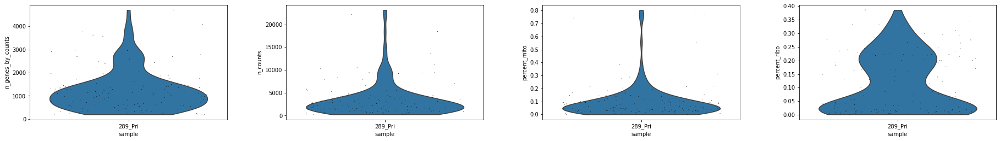

Post-filter violin plots


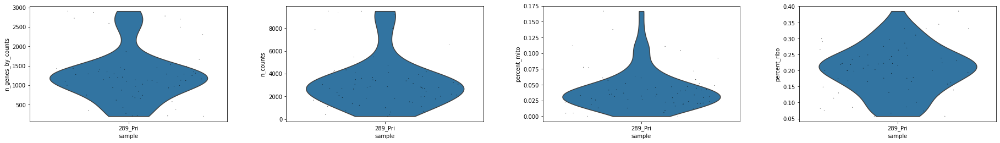

Filtered out 74 cells, number left in 289_Pri is 68


In [71]:
sample_289_Pri = combined[combined.obs['sample']=='289_Pri'];

print("Pre-filter violin plots");
sc.pl.violin(sample_289_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 289_Pri
kept_cell['289_Pri'] = (combined.obs['n_counts'] < 10000) & (combined.obs['sample'] == '289_Pri') & (combined.obs['percent_mito'] < 0.4) & (combined.obs['percent_ribo'] > 0.05);
number_filtered = str(len(combined[combined.obs['sample']=='289_Pri'].obs['total_counts'])-sum(kept_cell['289_Pri']));

print("Post-filter violin plots");
sc.pl.violin(combined[kept_cell['289_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 289_Pri is {}".format(number_filtered,str(sum(kept_cell['289_Pri']))));

## Cell-filtering for 290_Pri

Look at the original distributions

Pre-filter violin plots


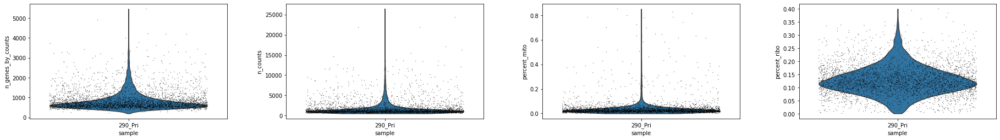

Post-filter violin plots


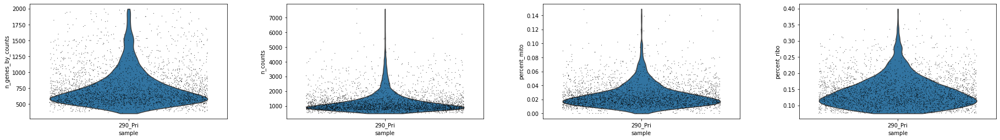

Filtered out 681 cells, number left in 290_Pri is 3293


In [72]:
sample_290_Pri = combined[combined.obs['sample']=='290_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_290_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 290_Pri
kept_cell['290_Pri'] = (combined.obs['n_genes_by_counts'] < 2000) & (combined.obs['sample'] == '290_Pri') & (combined.obs['percent_mito'] < 0.15) & (combined.obs['percent_ribo'] > 0.075)
number_filtered = str(len(combined[combined.obs['sample']=='290_Pri'].obs['total_counts'])-sum(kept_cell['290_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['290_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 290_Pri is {}".format(number_filtered,str(sum(kept_cell['290_Pri']))))

## Cell-filtering for 290_LN2

Pre-filter violin plots


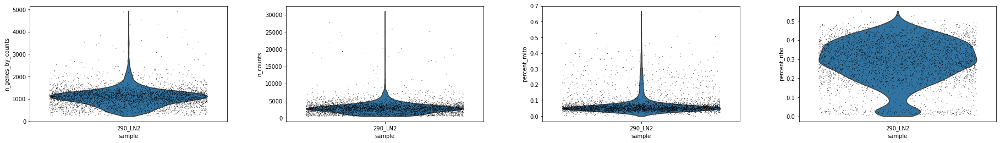

Post-filter violin plots


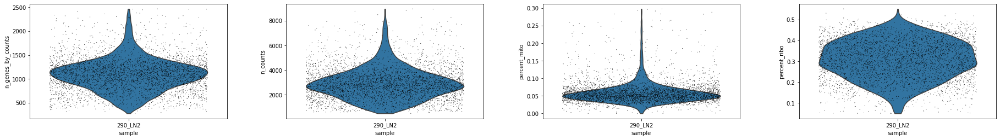

Filtered out 311 cells, number left in 290_LN2 is 4027


In [73]:
sample_290_LN2 = combined[combined.obs['sample']=='290_LN2']

print("Pre-filter violin plots")
sc.pl.violin(sample_290_LN2, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 290_LN2
kept_cell['290_LN2'] = (combined.obs['n_genes_by_counts'] < 2500) & (combined.obs['sample'] == '290_LN2') & (combined.obs['n_counts'] <9000) & (combined.obs['percent_mito'] < 0.3) & (combined.obs['percent_ribo'] > 0.05)
number_filtered = str(len(combined[combined.obs['sample']=='290_LN2'].obs['total_counts'])-sum(kept_cell['290_LN2']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['290_LN2'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 290_LN2 is {}".format(number_filtered,str(sum(kept_cell['290_LN2']))))

## Cell-filtering for 291_Pri

Pre-filter violin plots


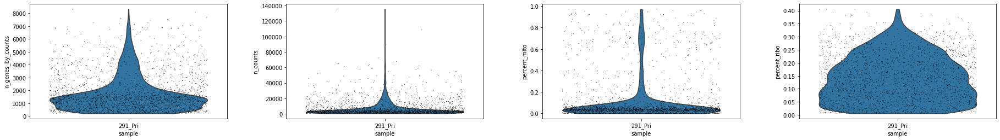

Post-filter violin plots


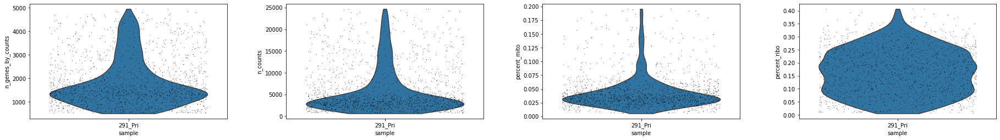

Filtered out 875 cells, number left in 291_Pri is 1674


In [74]:
sample_291_Pri = combined[combined.obs['sample']=='291_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_291_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 291_Pri
kept_cell['291_Pri'] = (combined.obs['n_genes_by_counts'] < 5000) &(combined.obs['n_genes_by_counts'] > 500) &(combined.obs['percent_mito'] > 0.005)& (combined.obs['sample'] == '291_Pri') & (combined.obs['n_counts'] <25000) & (combined.obs['percent_mito'] < 0.20) & (combined.obs['percent_ribo']>0.)
number_filtered = str(len(combined[combined.obs['sample']=='291_Pri'].obs['total_counts'])-sum(kept_cell['291_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['291_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 291_Pri is {}".format(number_filtered,str(sum(kept_cell['291_Pri']))))

## Cell-filtering for 295

Pre-filter violin plots


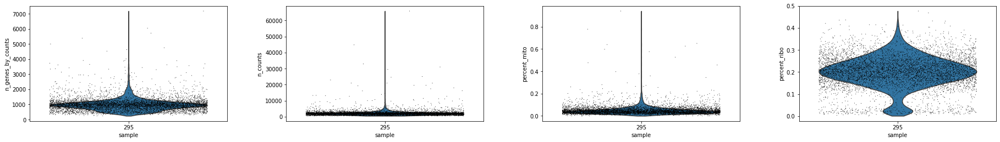

Post-filter violin plots


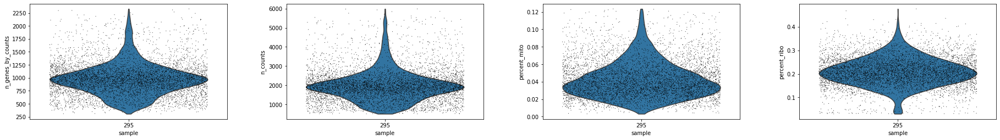

Filtered out 434 cells, number left in 295 is 5982


In [75]:
sample_295 = combined[combined.obs['sample']=='295']

print("Pre-filter violin plots")
sc.pl.violin(sample_295, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 295
kept_cell['295'] = (combined.obs['n_genes_by_counts'] <2500) &(combined.obs['percent_mito'] > 0.002)& (combined.obs['sample'] == '295') & (combined.obs['n_counts'] <6000) & (combined.obs['percent_mito'] < 0.125)& (combined.obs['percent_ribo'] > 0.03)
number_filtered = str(len(combined[combined.obs['sample']=='295'].obs['total_counts'])-sum(kept_cell['295']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['295'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 295 is {}".format(number_filtered,str(sum(kept_cell['295']))))

## Cell-filtering for 296_Pri_CD8pos

Pre-filter violin plots


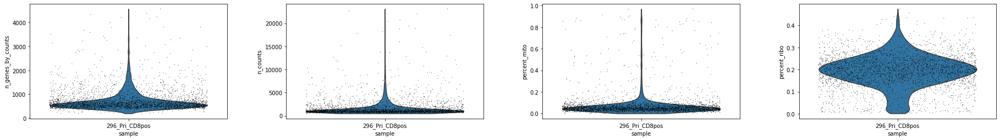

Post-filter violin plots


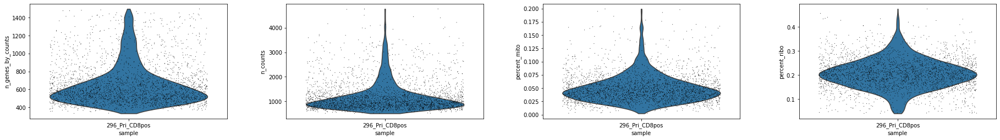

Filtered out 346 cells, number left in 296_Pri_CD8pos is 2760


In [76]:
sample_296_Pri_CD8pos = combined[combined.obs['sample']=='296_Pri_CD8pos']

print("Pre-filter violin plots")
sc.pl.violin(sample_296_Pri_CD8pos, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 296_Pri_CD8pos
kept_cell['296_Pri_CD8pos'] = (combined.obs['n_genes_by_counts'] <1500) &(combined.obs['percent_mito'] > 0.002)& (combined.obs['sample'] == '296_Pri_CD8pos') & (combined.obs['n_counts'] <5000) & (combined.obs['percent_mito'] < 0.20)& (combined.obs['percent_ribo'] > 0.04)
number_filtered = str(len(combined[combined.obs['sample']=='296_Pri_CD8pos'].obs['total_counts'])-sum(kept_cell['296_Pri_CD8pos']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['296_Pri_CD8pos'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 296_Pri_CD8pos is {}".format(number_filtered,str(sum(kept_cell['296_Pri_CD8pos']))))

## Cell-filtering for 296_Pri_CD8neg

Pre-filter violin plots


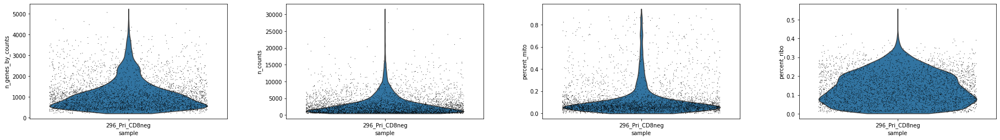

Post-filter violin plots


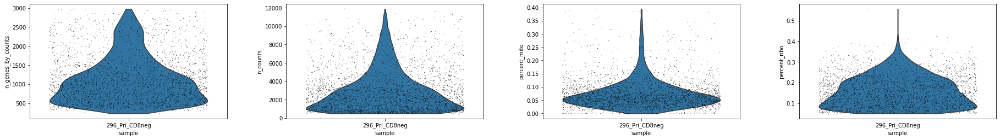

Filtered out 813 cells, number left in 296_Pri_CD8neg is 3027


In [77]:
sample_296_Pri_CD8neg = combined[combined.obs['sample']=='296_Pri_CD8neg']

print("Pre-filter violin plots")
sc.pl.violin(sample_296_Pri_CD8neg, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 296_Pri_CD8neg
kept_cell['296_Pri_CD8neg'] = (combined.obs['n_genes_by_counts'] <3000) & (combined.obs['sample'] == '296_Pri_CD8neg') & (combined.obs['n_counts'] <12000) & (combined.obs['percent_mito'] < 0.4) & (combined.obs['percent_ribo']>0.05)
number_filtered = str(len(combined[combined.obs['sample']=='296_Pri_CD8neg'].obs['total_counts'])-sum(kept_cell['296_Pri_CD8neg']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['296_Pri_CD8neg'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 296_Pri_CD8neg is {}".format(number_filtered,str(sum(kept_cell['296_Pri_CD8neg']))))

## Cell-filtering for 304_Pri

Pre-filter violin plots


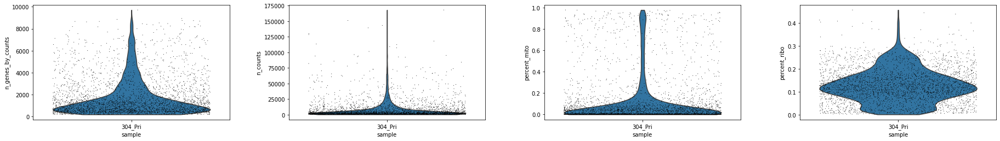

Post-filter violin plots


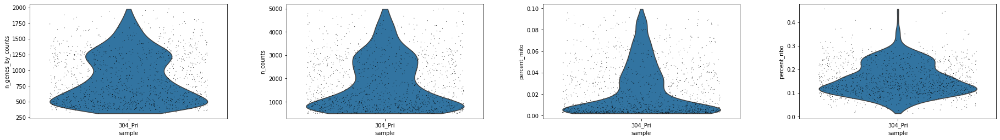

Filtered out 2057 cells, number left in 304_Pri is 1283


In [78]:
sample_304_Pri = combined[combined.obs['sample']=='304_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_304_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 304_Pri
kept_cell['304_Pri'] = (combined.obs['n_genes_by_counts'] <2000) &(combined.obs['percent_mito'] > 0.002)& (combined.obs['sample'] == '304_Pri') & (combined.obs['n_counts'] <5000) & (combined.obs['percent_mito'] < 0.10)
number_filtered = str(len(combined[combined.obs['sample']=='304_Pri'].obs['total_counts'])-sum(kept_cell['304_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['304_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 304_Pri is {}".format(number_filtered,str(sum(kept_cell['304_Pri']))))

## Cell-filtering for 305_1_Pri

Pre-filter violin plots


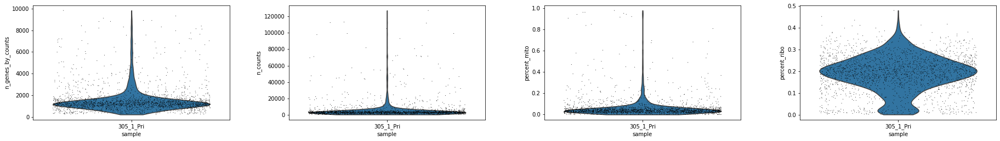

Post-filter violin plots


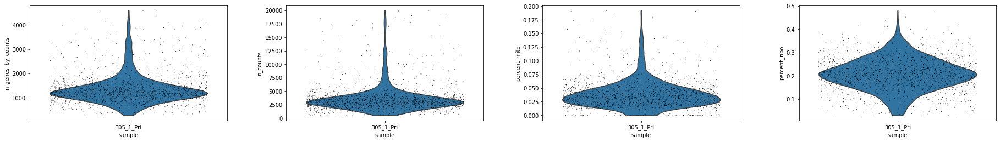

Filtered out 243 cells, number left in 305_1_Pri is 1914


In [79]:
sample_305_1_Pri = combined[combined.obs['sample']=='305_1_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_305_1_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 305_1_Pri
kept_cell['305_1_Pri'] = (combined.obs['n_genes_by_counts'] <6000) & (combined.obs['sample'] == '305_1_Pri') & (combined.obs['n_counts'] <20000) & (combined.obs['percent_mito'] < 0.20)& (combined.obs['percent_ribo'] > 0.03)
number_filtered = str(len(combined[combined.obs['sample']=='305_1_Pri'].obs['total_counts'])-sum(kept_cell['305_1_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['305_1_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 305_1_Pri is {}".format(number_filtered,str(sum(kept_cell['305_1_Pri']))))

## Cell-filtering for 305_2_Pri

Pre-filter violin plots


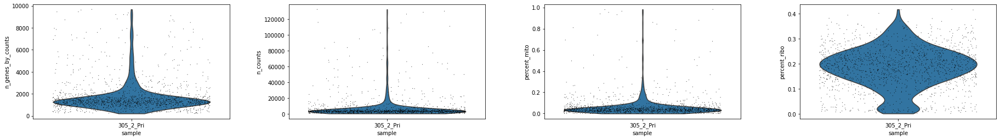

Post-filter violin plots


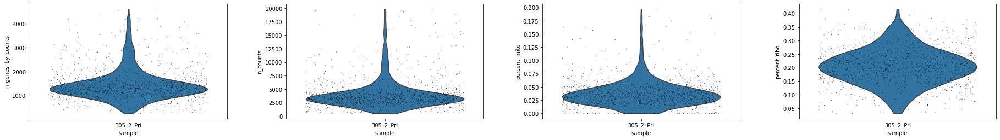

Filtered out 211 cells, number left in 305_2_Pri is 1360


In [80]:
sample_305_2_Pri = combined[combined.obs['sample']=='305_2_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_305_2_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 305_2_Pri
kept_cell['305_2_Pri'] = (combined.obs['n_genes_by_counts'] <6000) & (combined.obs['sample'] == '305_2_Pri') & (combined.obs['n_counts'] <20000) & (combined.obs['percent_mito'] < 0.20)& (combined.obs['percent_ribo'] > 0.03)
number_filtered = str(len(combined[combined.obs['sample']=='305_2_Pri'].obs['total_counts'])-sum(kept_cell['305_2_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['305_2_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 305_2_Pri is {}".format(number_filtered,str(sum(kept_cell['305_2_Pri']))))

## Cell-filtering for 307_Pri

Pre-filter violin plots


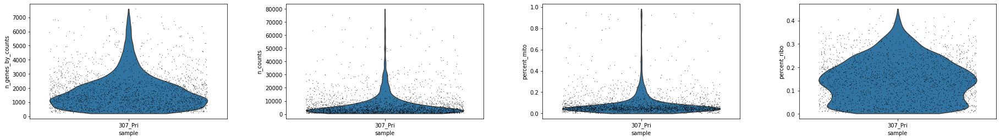

Post-filter violin plots


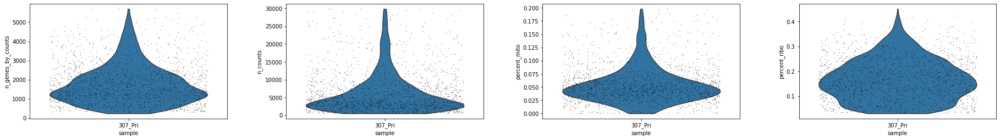

Filtered out 398 cells, number left in 307_Pri is 1930


In [81]:
sample_307_Pri = combined[combined.obs['sample']=='307_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_307_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 307_Pri
kept_cell['307_Pri'] = (combined.obs['n_genes_by_counts'] <6000) & (combined.obs['sample'] == '307_Pri') & (combined.obs['n_counts'] <30000) & (combined.obs['percent_mito'] < 0.2)& (combined.obs['percent_ribo'] > 0.03)
number_filtered = str(len(combined[combined.obs['sample']=='307_Pri'].obs['total_counts'])-sum(kept_cell['307_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['307_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 307_Pri is {}".format(number_filtered,str(sum(kept_cell['307_Pri']))))

## Cell-filtering for 307_sLN

Pre-filter violin plots


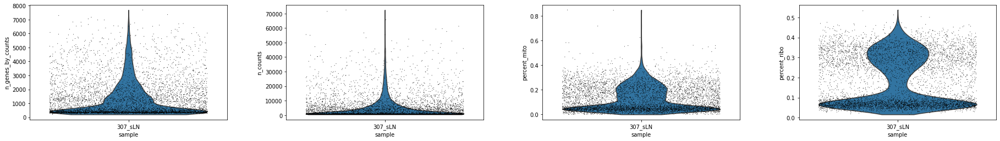

Post-filter violin plots


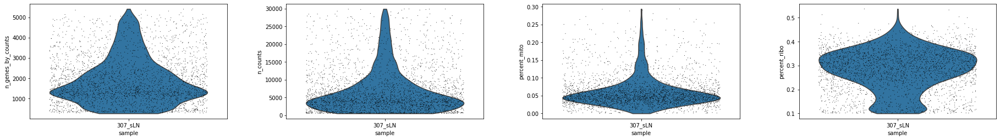

Filtered out 2784 cells, number left in 307_sLN is 2911


In [82]:
sample_307_sLN = combined[combined.obs['sample']=='307_sLN']

print("Pre-filter violin plots")
sc.pl.violin(sample_307_sLN, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 307_sLN
kept_cell['307_sLN'] = (combined.obs['n_genes_by_counts'] <6000) & (combined.obs['sample'] == '307_sLN') & (combined.obs['n_counts'] <30000) & (combined.obs['percent_mito'] < 0.3) & (combined.obs['percent_ribo']>0.1)
number_filtered = str(len(combined[combined.obs['sample']=='307_sLN'].obs['total_counts'])-sum(kept_cell['307_sLN']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['307_sLN'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 307_sLN is {}".format(number_filtered,str(sum(kept_cell['307_sLN']))))

## Cell-filtering for 309_Pri

Pre-filter violin plots


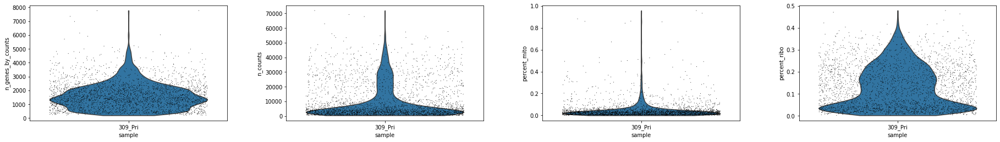

Post-filter violin plots


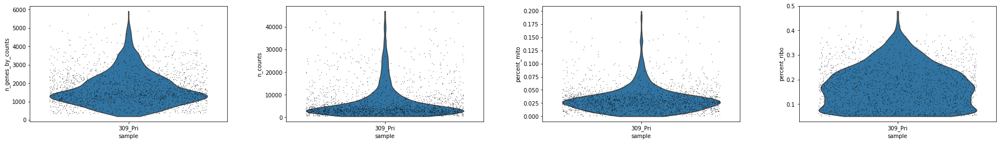

Filtered out 895 cells, number left in 309_Pri is 2001


In [83]:
sample_309_Pri = combined[combined.obs['sample']=='309_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_309_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 309_Pri
kept_cell['309_Pri'] = (combined.obs['n_genes_by_counts'] <6000) & (combined.obs['sample'] == '309_Pri') & (combined.obs['n_counts'] <50000) & (combined.obs['percent_mito'] < 0.2) & (combined.obs['percent_ribo']>0.05)
number_filtered = str(len(combined[combined.obs['sample']=='309_Pri'].obs['total_counts'])-sum(kept_cell['309_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['309_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 309_Pri is {}".format(number_filtered,str(sum(kept_cell['309_Pri']))))

## Cell-filtering for 309_sLN

Pre-filter violin plots


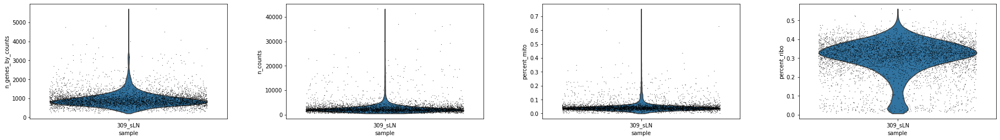

Post-filter violin plots


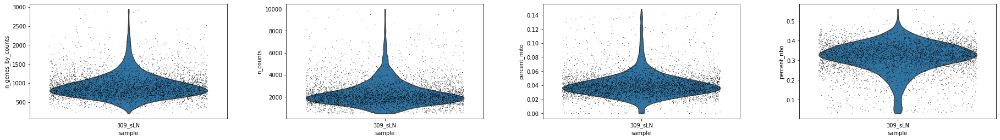

Filtered out -5028 cells, number left in 309_sLN is 5028


In [84]:
sample_309_sLN = combined[combined.obs['sample']=='309_sLN']

print("Pre-filter violin plots")
sc.pl.violin(sample_309_sLN, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 309_sLN
kept_cell['309_sLN'] = (combined.obs['n_genes_by_counts'] <3000) & (combined.obs['sample'] == '309_sLN') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito'] < 0.15)& (combined.obs['percent_ribo'] > 0.03)
number_filtered = str(len(combined[combined.obs['sample']=='HN309_sLN'].obs['total_counts'])-sum(kept_cell['309_sLN']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['309_sLN'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 309_sLN is {}".format(number_filtered,str(sum(kept_cell['309_sLN']))))

## Cell-filtering for 310

Pre-filter violin plots


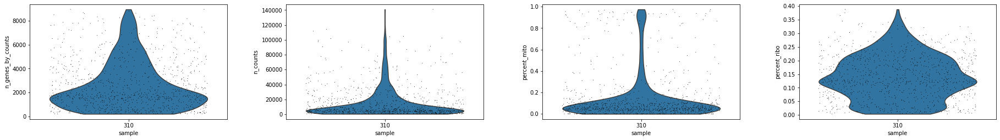

Post-filter violin plots


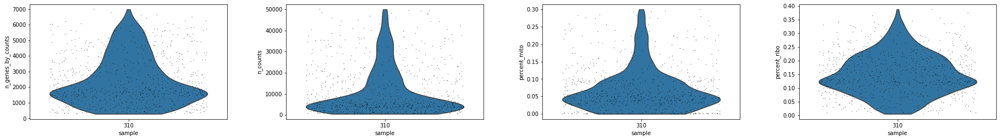

Filtered out 175 cells, number left in 310 is 804


In [85]:
sample_310 = combined[combined.obs['sample']=='310']

print("Pre-filter violin plots")
sc.pl.violin(sample_310, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 310
kept_cell['310'] = (combined.obs['n_genes_by_counts'] <10000) & (combined.obs['sample'] == '310') & (combined.obs['n_counts'] <50000)& (combined.obs['percent_mito']<0.3) 
number_filtered = str(len(combined[combined.obs['sample']=='310'].obs['total_counts'])-sum(kept_cell['310']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['310'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 310 is {}".format(number_filtered,str(sum(kept_cell['310']))))

## Cell-filtering for 313

Pre-filter violin plots


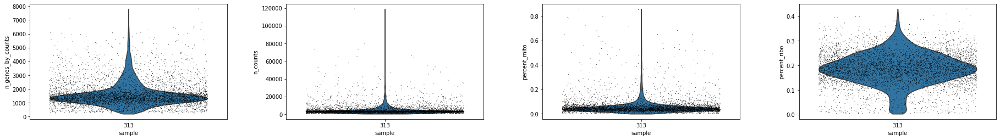

Post-filter violin plots


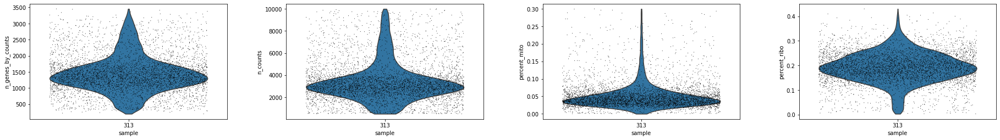

Filtered out 487 cells, number left in 313 is 4955


In [86]:
sample_313 = combined[combined.obs['sample']=='313']

print("Pre-filter violin plots")
sc.pl.violin(sample_313, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 313
kept_cell['313'] = (combined.obs['n_genes_by_counts'] <8000) & (combined.obs['sample'] == '313') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito']<0.3) 
number_filtered = str(len(combined[combined.obs['sample']=='313'].obs['total_counts'])-sum(kept_cell['313']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['313'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 313 is {}".format(number_filtered,str(sum(kept_cell['313']))))

## Cell-filtering for 314

Pre-filter violin plots


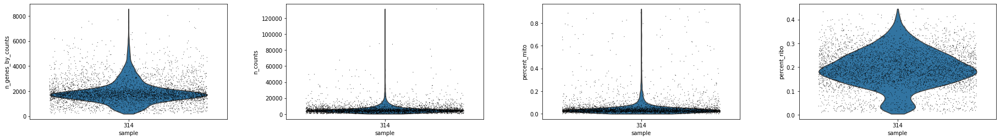

Post-filter violin plots


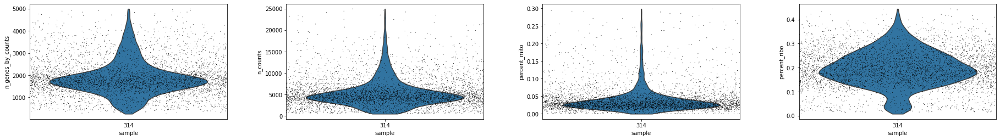

Filtered out 167 cells, number left in 314 is 4663


In [87]:
sample_314 = combined[combined.obs['sample']=='314']

print("Pre-filter violin plots")
sc.pl.violin(sample_314, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 314
kept_cell['314'] = (combined.obs['n_genes_by_counts'] <5000) & (combined.obs['sample'] == '314') & (combined.obs['n_counts'] <25000) & (combined.obs['percent_mito']<0.3) 
number_filtered = str(len(combined[combined.obs['sample']=='314'].obs['total_counts'])-sum(kept_cell['314']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['314'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.5,groupby='sample');

print("Filtered out {} cells, number left in 314 is {}".format(number_filtered,str(sum(kept_cell['314']))))

## Cell-filtering for 315

Pre-filter violin plots


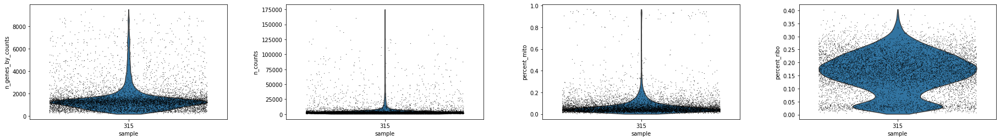

Post-filter violin plots


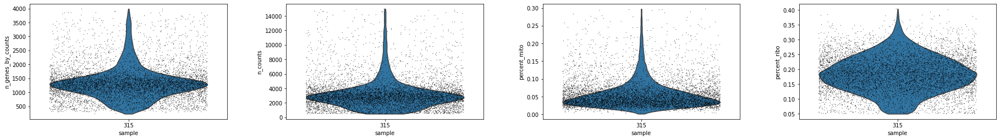

Filtered out 1555 cells, number left in 315 is 7085


In [88]:
sample_315 = combined[combined.obs['sample']=='315']

print("Pre-filter violin plots")
sc.pl.violin(sample_315, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 315
kept_cell['315'] = (combined.obs['n_genes_by_counts'] <4000) & (combined.obs['sample'] == '315') & (combined.obs['n_counts'] <15000) & (combined.obs['percent_mito']<0.3) & (combined.obs['percent_ribo']>0.05)
number_filtered = str(len(combined[combined.obs['sample']=='315'].obs['total_counts'])-sum(kept_cell['315']))

print("Post-filter violin plots")

sc.pl.violin(combined[kept_cell['315'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');
print("Filtered out {} cells, number left in 315 is {}".format(number_filtered,str(sum(kept_cell['315']))))

## Cell-filtering for 316

Pre-filter violin plots


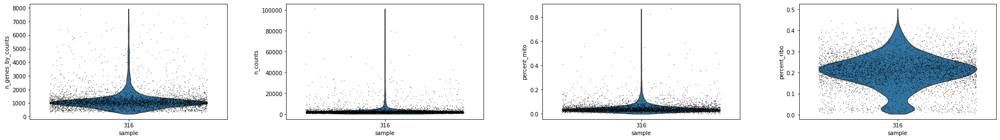

Post-filter violin plots


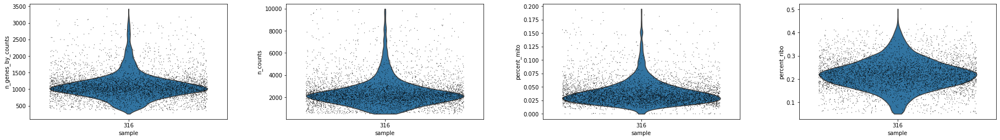

Filtered out 523 cells, number left in 316 is 5001


In [89]:
sample_316 = combined[combined.obs['sample']=='316']

print("Pre-filter violin plots")
sc.pl.violin(sample_316, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 316
kept_cell['316'] = (combined.obs['n_genes_by_counts'] <4000) & (combined.obs['sample'] == '316') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito']<0.2) & (combined.obs['percent_ribo']>0.05) 
number_filtered = str(len(combined[combined.obs['sample']=='316'].obs['total_counts'])-sum(kept_cell['316']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['316'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 316 is {}".format(number_filtered,str(sum(kept_cell['316']))))

## Cell-filtering for 325_Pri

Pre-filter violin plots


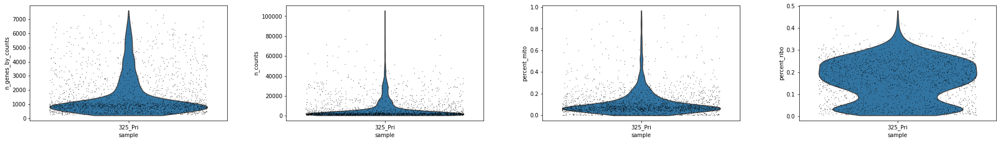

Post-filter violin plots


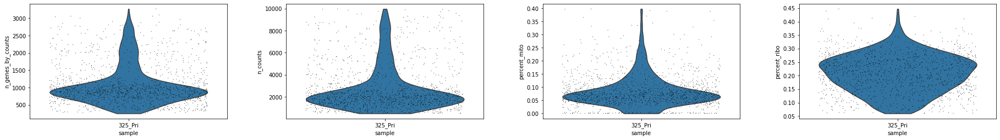

Filtered out 800 cells, number left in 325_Pri is 1457


In [90]:
sample_325_Pri = combined[combined.obs['sample']=='325_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_325_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 325_Pri
kept_cell['325_Pri'] = (combined.obs['n_genes_by_counts'] <4000) & (combined.obs['sample'] == '325_Pri') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito']<0.4) & (combined.obs['percent_ribo']>0.06) 
number_filtered = str(len(combined[combined.obs['sample']=='325_Pri'].obs['total_counts'])-sum(kept_cell['325_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['325_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 325_Pri is {}".format(number_filtered,str(sum(kept_cell['325_Pri']))))

## Cell-filtering for 325_sLN

Pre-filter violin plots


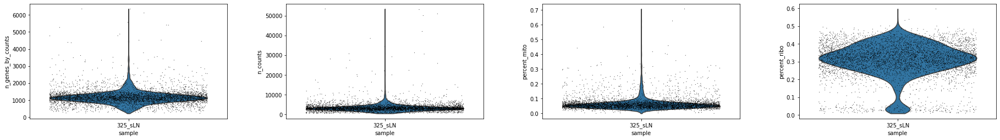

Post-filter violin plots


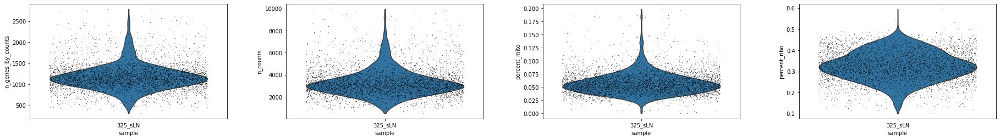

Filtered out 310 cells, number left in 325_sLN is 4721


In [91]:
sample_325_sLN = combined[combined.obs['sample']=='325_sLN']

print("Pre-filter violin plots")
sc.pl.violin(sample_325_sLN, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 325_sLN
kept_cell['325_sLN'] = (combined.obs['n_genes_by_counts'] <3000) & (combined.obs['sample'] == '325_sLN') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito']<0.2) & (combined.obs['percent_ribo']>0.1) 
number_filtered = str(len(combined[combined.obs['sample']=='325_sLN'].obs['total_counts'])-sum(kept_cell['325_sLN']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['325_sLN'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 325_sLN is {}".format(number_filtered,str(sum(kept_cell['325_sLN']))))

## Cell-filtering for 330_Pri

Pre-filter violin plots


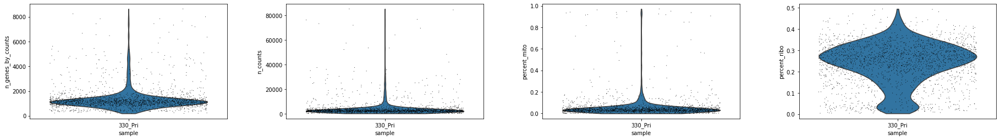

Post-filter violin plots


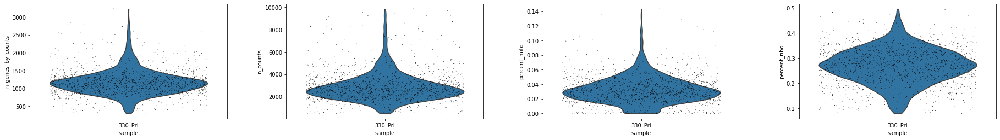

Filtered out 304 cells, number left in 330_Pri is 1825


In [92]:
sample_330_Pri = combined[combined.obs['sample']=='330_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_330_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 330_Pri
kept_cell['330_Pri'] = (combined.obs['n_genes_by_counts'] <4000) & (combined.obs['sample'] == '330_Pri') & (combined.obs['n_counts'] <10000) & (combined.obs['percent_mito']<0.15) & (combined.obs['percent_ribo']>0.08) 
number_filtered = str(len(combined[combined.obs['sample']=='330_Pri'].obs['total_counts'])-sum(kept_cell['330_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['330_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 330_Pri is {}".format(number_filtered,str(sum(kept_cell['330_Pri']))))

## Cell-filtering for 330_Met

Pre-filter violin plots


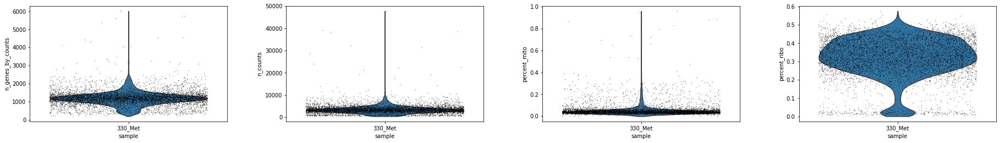

Post-filter violin plots


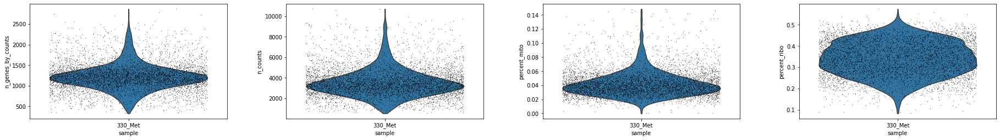

Filtered out 389 cells, number left in 330_Met is 5826


In [93]:
sample_330_Met = combined[combined.obs['sample']=='330_Met']

print("Pre-filter violin plots")
sc.pl.violin(sample_330_Met, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 338_Met
kept_cell['330_Met'] = (combined.obs['n_genes_by_counts'] <3000) & (combined.obs['sample'] == '330_Met') & (combined.obs['n_counts'] <11000) & (combined.obs['percent_mito']<0.15) & (combined.obs['percent_ribo']>0.08) 
number_filtered = str(len(combined[combined.obs['sample']=='330_Met'].obs['total_counts'])-sum(kept_cell['330_Met']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['330_Met'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 330_Met is {}".format(number_filtered,str(sum(kept_cell['330_Met']))))

## Cell-filtering for 338_Pri

Pre-filter violin plots


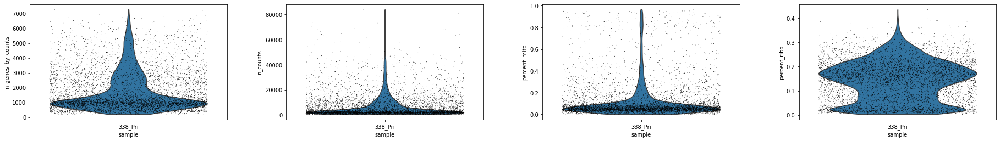

Post-filter violin plots


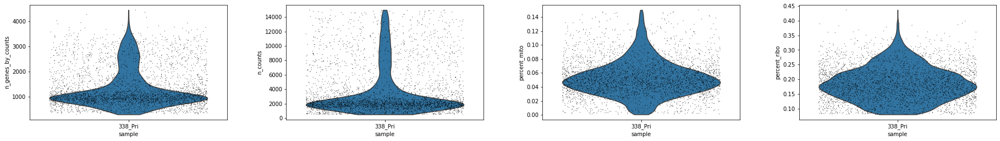

Filtered out 2215 cells, number left in 338_Pri is 3656


In [94]:
sample_338_Pri = combined[combined.obs['sample']=='338_Pri']

print("Pre-filter violin plots")
sc.pl.violin(sample_338_Pri, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 338_Pri
kept_cell['338_Pri'] = (combined.obs['n_genes_by_counts'] <5000) & (combined.obs['sample'] == '338_Pri') & (combined.obs['n_counts'] <15000) & (combined.obs['percent_mito']<0.15) & (combined.obs['percent_ribo']>0.08) 
number_filtered = str(len(combined[combined.obs['sample']=='338_Pri'].obs['total_counts'])-sum(kept_cell['338_Pri']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['338_Pri'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 338_Pri is {}".format(number_filtered,str(sum(kept_cell['338_Pri']))))

## Cell-filtering for 338_LN2

Pre-filter violin plots


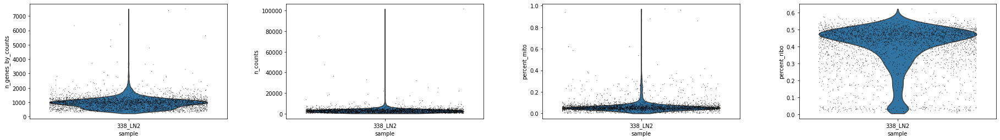

Post-filter violin plots


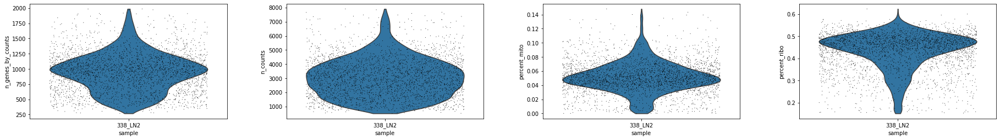

Filtered out 330 cells, number left in 338_LN2 is 3038


In [95]:
sample_338_LN2 = combined[combined.obs['sample']=='338_LN2']

print("Pre-filter violin plots")
sc.pl.violin(sample_338_LN2, ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

# filter for 338_Pri
kept_cell['338_LN2'] = (combined.obs['n_genes_by_counts'] <2000) & (combined.obs['sample'] == '338_LN2') & (combined.obs['n_counts'] <8000) & (combined.obs['percent_mito']<0.15) & (combined.obs['percent_ribo']>0.15) 
number_filtered = str(len(combined[combined.obs['sample']=='338_LN2'].obs['total_counts'])-sum(kept_cell['338_LN2']))

print("Post-filter violin plots")
sc.pl.violin(combined[kept_cell['338_LN2'],:], ['n_genes_by_counts','n_counts','percent_mito','percent_ribo'], jitter=0.4,groupby='sample');

print("Filtered out {} cells, number left in 338_LN2 is {}".format(number_filtered,str(sum(kept_cell['338_LN2']))))

In [96]:
# Combining all cell-filtered datasets
combined_kept_cell = kept_cell['289_Pri']
for data_set in kept_cell:
    combined_kept_cell = combined_kept_cell | kept_cell[data_set]

combined =combined[combined_kept_cell,:]

# Gene Filtering

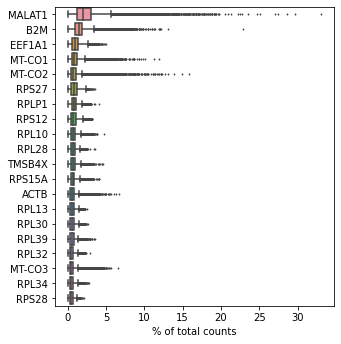

In [97]:
sc.pl.highest_expr_genes(combined, n_top=20)

A few things we can see:
(1) MALAT1 is the highest
(2) a lot of top genes are ribosomal or mitochondrial

As the level of expression of MALAT1 genes are much much higher (which goes up to 34%) than that of the rest genes, we do want to remove them from the dataset to before we encounter technical issues in further steps (due to normalization). We also want to remove mitochondrial genes which only concern dead/dying cells, and MALAT1 and ribosomal genes could create batch effects. There are other ways how these genes can affect downstream analysis results as well. However, before actually removing them, we do a careful check to make sure that these genes don't correpond to a lot of biological significance for samples

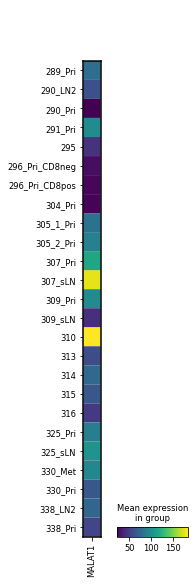

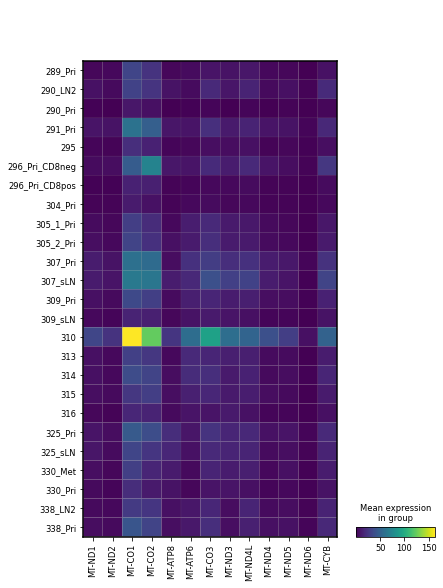

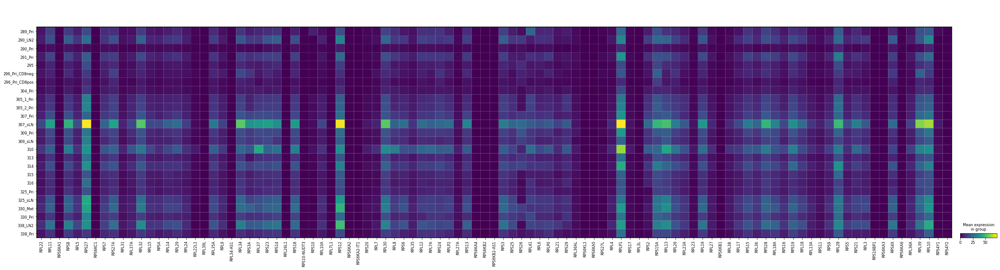

In [98]:
# Look at the distribution of ribosomal genes and mitochondrial genes
 # since some genes have been filtered, we need to reselect mito and ribo from the remaining genes
ribo_genes = combined.var_names.str.startswith(("RPS","RPL"))
mito_genes = combined.var_names.str.startswith('MT-')
malat1 = combined.var_names.str.startswith('MALAT1')

sc.pl.matrixplot(combined, list(combined.var_names[malat1]), groupby='sample')
sc.pl.matrixplot(combined, list(combined.var_names[mito_genes]), groupby='sample')
sc.pl.matrixplot(combined, list(combined.var_names[ribo_genes]), groupby='sample')

#### Based on what we see here, the expression levels of most of these genes in most of the samples are either all high or all low. So we could safely filter them out.

In [99]:
# Filter out MALAT1 and MT- genes which are irrelevant will affect downstream analysis
remove = np.add(ribo_genes,mito_genes)
remove = np.add(remove,malat1)

kept_genes = np.invert(remove)
combined = combined[:,kept_genes]

#### Now look at the number of cells left for each samples and in total

In [100]:
print("After filter, the number of cells in each sample is:")
for sample in dataset_names:
    print("{}: {}".format(sample,str(sum(kept_cell[sample]))))
print("The total number of cells: {}".format(combined.n_obs))

After filter, the number of cells in each sample is:
289_Pri: 68
290_Pri: 3293
295: 5982
296_Pri_CD8pos: 2760
305_1_Pri: 1914
307_Pri: 1930
309_Pri: 2001
310: 804
314: 4663
316: 5001
290_LN2: 4027
291_Pri: 1674
296_Pri_CD8neg: 3027
304_Pri: 1283
305_2_Pri: 1360
307_sLN: 2911
309_sLN: 5028
313: 4955
315: 7085
325_Pri: 1457
325_sLN: 4721
330_Pri: 1825
330_Met: 5826
338_Pri: 3656
338_LN2: 3038
The total number of cells: 80289


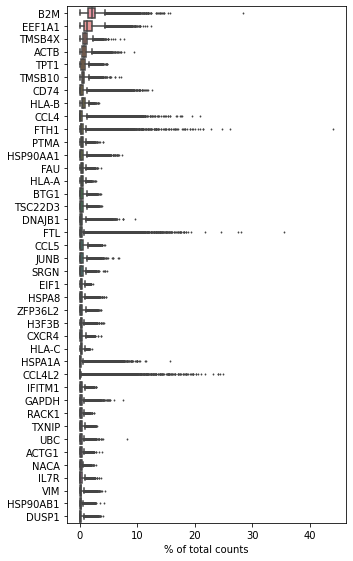

In [101]:
sc.pl.highest_expr_genes(combined, n_top=40)

# TCR Data QC

## Multichain Filtering

In [102]:
ir.tl.chain_qc(combined)

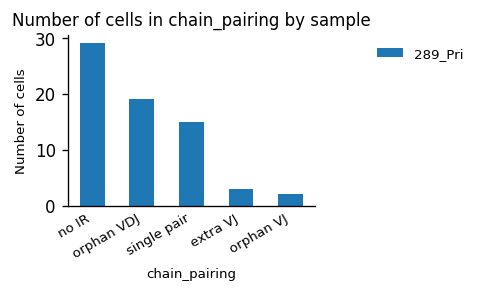

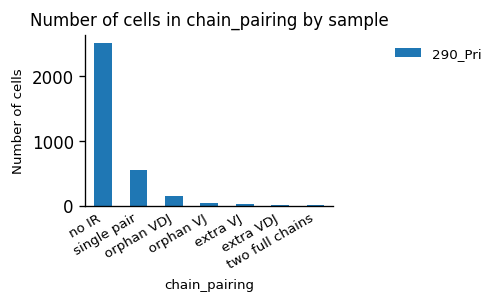

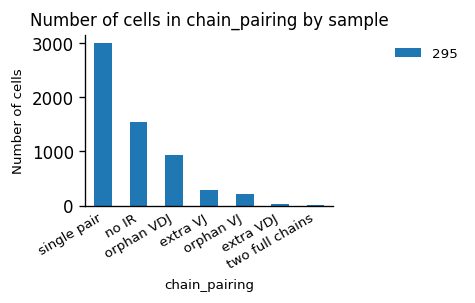

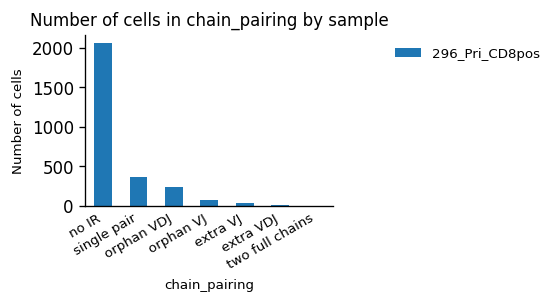

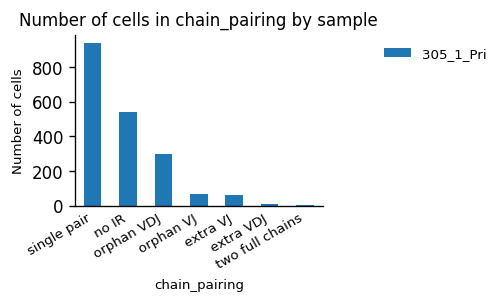

...

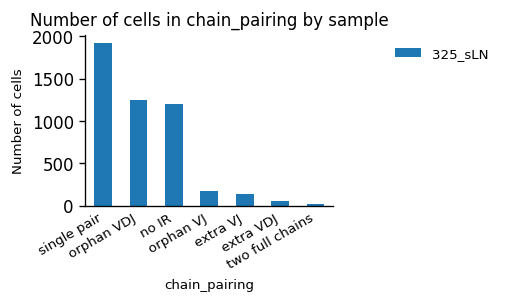

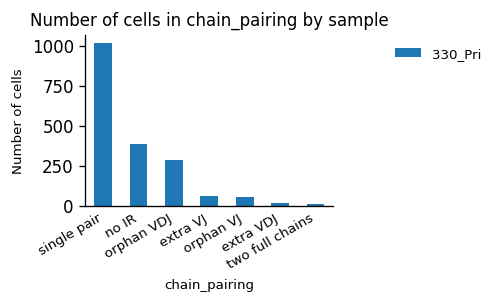

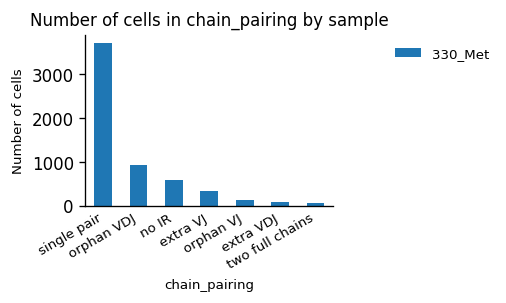

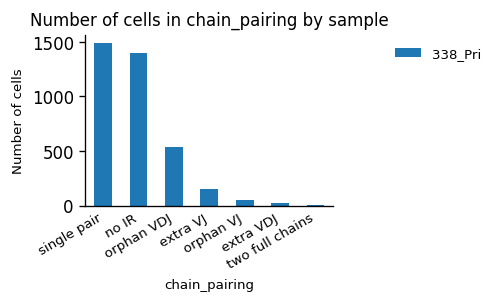

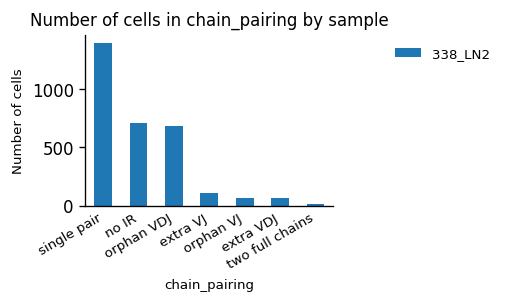

In [103]:
# Visualize chain pairing for each sample
for data_set in data_sets:
    ir.pl.group_abundance(combined[combined.obs['sample']==data_set], groupby="chain_pairing",target_col='sample')

<AxesSubplot:title={'center':'Number of cells in chain_pairing by bat'}, xlabel='chain_pairing', ylabel='Number of cells'>

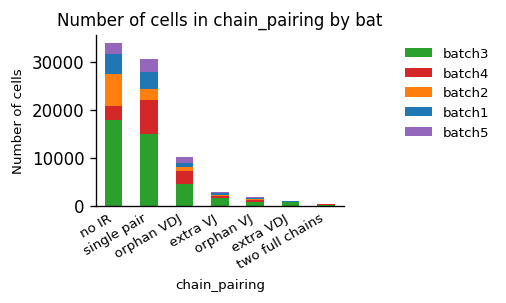

In [104]:
# Visualize chain pairing for each batch
ir.pl.group_abundance(combined, groupby="chain_pairing",target_col='bat')

In [105]:
for data_set in data_sets:
    print("For {}, the fraction of cells with more than one pair of TCRs: {:.3f}".format(
        data_set, np.sum(combined[combined.obs['sample']==data_set].obs["chain_pairing"].isin(["extra VJ", "extra VDJ", "two full chains"]))
        /combined[combined.obs['sample']==data_set].n_obs)
         )

For 289_Pri, the fraction of cells with more than one pair of TCRs: 0.044
For 290_Pri, the fraction of cells with more than one pair of TCRs: 0.012
For 295, the fraction of cells with more than one pair of TCRs: 0.051
For 296_Pri_CD8pos, the fraction of cells with more than one pair of TCRs: 0.016
For 305_1_Pri, the fraction of cells with more than one pair of TCRs: 0.039
For 307_Pri, the fraction of cells with more than one pair of TCRs: 0.032
For 309_Pri, the fraction of cells with more than one pair of TCRs: 0.043
For 310, the fraction of cells with more than one pair of TCRs: 0.017
For 314, the fraction of cells with more than one pair of TCRs: 0.140
For 316, the fraction of cells with more than one pair of TCRs: 0.041
For 290_LN2, the fraction of cells with more than one pair of TCRs: 0.057
For 291_Pri, the fraction of cells with more than one pair of TCRs: 0.062
For 296_Pri_CD8neg, the fraction of cells with more than one pair of TCRs: 0.002
For 304_Pri, the fraction of cells wit

#### We only keep the cells with less than or equal to two full pair of alpha/beta chains because any cell with more than that is a multiplet

In [106]:
combined = combined[combined.obs["multi_chain"] != "True", :].copy()

In [107]:
save_file = '/scratch/qc_filtered_combined_samples.h5ad'
combined.write_h5ad(save_file)